# Swish Analytics: NFL Data Scientist Take Home Assesment

## Author: Hunter Lybbert

### Contact Information

<a href="https://linkedin.com/in/hunter-lybbert" target="_blank">
  <img src="https://upload.wikimedia.org/wikipedia/commons/0/01/LinkedIn_Logo.svg" width="160">
</a>
<a href="https://github.com/hunter-lybbert" target="_blank">
  <img src="https://upload.wikimedia.org/wikipedia/commons/9/91/Octicons-mark-github.svg" width="45"  style="margin-right:10px;">
</a>
<a href="mailto:hunterlybbert@gmail.com" target="_blank">
  <img src="https://upload.wikimedia.org/wikipedia/commons/7/7e/Gmail_icon_%282020%29.svg" width="50" style="margin-right:10px;">
</a>

## Outline
1. [Summary](#Summary)
2. [Brainstorm](#Brainstorm)
3. [Setup](#Setup)
4. [Exploratory Data Analysis (EDA)](#Exploratory-Data-Analysis)
5. [Modeling](#Build-Predictive-Models)
6. [Conclusions and Future Work](#Conclusions-and-Future-Work)


## Summary
[![Return to Top](https://img.shields.io/badge/⬆-Top-blue)](#Outline)

In this notebook we analyze Historical NFL game data.
We attempt to predict the probability that the next pass play will result in a sack.
Sacks can be a huge moment in NFL games where the momentum can totally shift or it can be the nail in the coffin.
Hence, there is a lot of motivation to be able to predict the likelihood of a sack occuring for both the offense, defense, and even the viewers experience which is the case in the context of Swish Analytics as they are providing data for sports betting platforms.

The data provided includes play by play information for all games in the 2021-2023 seasons.
Additionally there was metadata provided which contained information about team rosters in those same years, all nfl players of all time, depth charts, playing time information, and lastly advanced stats for defensive players, rushers, and passers.

Our analysis goes as follows
1. Assess the data
2. Build several predictive models, and finally
3. Compare and evaluate their performances against one another

Below you will find the exploratory data analysis including plots and graphs, feature engineering, and code assembled in one place.

##### Data Dictionaries
The following data dictionaries were crucial in helping with the analysis:
* [Dictionary](https://nflreadr.nflverse.com/articles/dictionary_pbp.html)
* [Depth Chart Dictionary](https://nflreadr.nflverse.com/articles/dictionary_depth_charts.html)
* [Snap Counts Dictionary](https://nflreadr.nflverse.com/articles/dictionary_snap_counts.html)
* [Dictionary Rosters](https://nflreadr.nflverse.com/articles/dictionary_rosters.html)


<img src="nfl.gif" width=500>

Depicted above is a nice hard hitting sack of Tom Brady.

## Brainstorm
[![Return to Top](https://img.shields.io/badge/⬆-Top-blue)](#Outline)

### Initial Ideas
My initial ideas for data that would be helpful in predicting the likelihood of a sack.
* Historical number of sacks for each player on the defense
    * You could also weight this by position, giving a higher weight to defensive lineman and a lower weight to strong safeties and corners (who sometimes are included in a blitz)
* Sacks allowed by the offensive linemen
    * This would be telling if the offensive lineman just tend to allow more sacks but we wouldn't expect this to be that big of a factor
* The number of times the particular quarterback in play has been sacked
* Down and distance
    * A sack must occur on a passing play or intended passing play
    * Would expect there to be more passes on later downs, but given a certain score differential and a time of the game, passes could become more likely on earlier downs
* Field position
    * Not exactly sure, but we do believe a sack would be unlikely behind your own 15-20ydl
* Score of the game
    * Larger differential would make the team that is down more likely to pass in more desperate situations which would perhaps lead to more sacks
* Timestamp of the game
    * more desperate later in the game could result in more sacks, not sure


### Mathematical Notation
For convenience let's establish a bit of notation around the probability distribution that a given passing play will result in a sack.
* Let $N$ be the total number of pass plays in our data set
* Let $S$ be the total number of sacks in our same dataset
* Let $X$ be our collection of data including metadata about each play.
With $\boldsymbol x_i$ being the $i^\text{th}$ row of $X$ which contains all of the information we have about a particular play.
* Let $\boldsymbol y$ be the associated outcomes of the plays in $X$.
Where $y_i = 1$ if the $i^\text{th}$ play resulted in a sack and $y_i = 0$ if it was not a sack.
* Finally, let $P(y_i=1|\boldsymbol x_i)$ be the probability that the $i^\text{th}$ play is a sack given the data $\boldsymbol x_i$ we have about that play.
Similarly $P(y_i=0|\boldsymbol x_i)$ represents the probability that a play does not end in a sack.


### Models to Try:
* Purely based on historical information
    * For example, the most naive model would be to say the probability that a given pass play will be a sack is just equal to the number of sacks diveded by the total number of pass plays, denoted as
    $$ P(y_i=1|\boldsymbol x_i) = \frac S N \quad \text{and}\quad P(y_i=0|\boldsymbol x_i) = \frac {N - S} N.$$
    * Then we could start to make it more complicated a little at a time
        * For example, you could suppose that $\boldsymbol x_i$ might contain information like "It is 3rd and 11 from the defensive team's 25 yardline with 3:00 minutes left in the 4th quarter".
        Denoting the number of sacks in this scenario as little $\sigma$ and the number of passing plays in this scenario as $\theta$ then
        $$ P(y_i=1|\boldsymbol x_i) = \frac \sigma \theta \quad \text{and}\quad P(y_i=0|\boldsymbol x_i) = \frac {\theta - \sigma} \theta.$$
        * You could get even more granular about each scenario based on how much information is incorporated into the data $X$.
* Train a model
    * Logistic Regression (great at determing probability distributions and binary classification)
    * Random forest regressor
        * Does this work when building a distribution?
        * We don’t just want to predict whether it’s a sack or not with a certain accuracy. We want to determine the odds it will happen
* Can deep learning help?


## Setup
[![Return to Top](https://img.shields.io/badge/⬆-Top-blue)](#Outline)

In [1]:
from typing import Optional
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    PrecisionRecallDisplay,
    f1_score,
    recall_score,
    accuracy_score,
    precision_score,
)
from xgboost import XGBClassifier

import altair as alt
import matplotlib.pyplot as plt


alt.data_transformers.disable_max_rows()
alt.renderers.enable('default')
pd.set_option('display.max_columns', None)

## Exploratory Data Analysis
[![Return to Top](https://img.shields.io/badge/⬆-Top-blue)](#Outline)

Let's begin by exploring and getting familiar with the various datasets which we have been provided with. Additionally for reference see the previously included [data dictionaries](#Data-Dictionaries).
For the sake of presenting a cleaner noteobok, we have commented out all but a few especially informative lines where we am printing out the contents of the data.

In [2]:
# Look into the players.csv and see what's present
# players_df = pd.read_csv("data/players.csv", header=0, nrows=1000)
# players_df.head()

In [3]:
# depth_charts_2022_df = pd.read_csv("data/depth_charts_2022.csv", header=0)
# depth_charts_2022_df[(depth_charts_2022_df["club_code"] == "SEA") & (depth_charts_2022_df["formation"] == "Defense")].sort_values(by=["week", "position", "depth_team"]).head(5)

In [4]:
play_by_play_2022_df = pd.read_csv("data/play_by_play_2022.csv", header=0, low_memory=False)
# play_by_play_2022_df.sort_values(by=['week', 'play_id']).dropna(subset=["play_type"]).head()

In [5]:
number_of_nan_play_types_per_game = play_by_play_2022_df[play_by_play_2022_df.play_type.isna()].groupby(["game_id"], as_index=False).agg({"play_id": "count"})
number_of_nan_play_types_per_game.play_id.value_counts().sort_index(ascending=False)

play_id
6     29
5    255
Name: count, dtype: int64

My biggest takeaway at this point was that there are plays with play_type which is null and this occurs when it is the beginning of a game and at the end of each quarter. Additionally it occurs at the end of periods of overtime.
This is really where the insight came.

Next Let's look more closely at a game I attended in Philly in 2022.
After what I believe was an 8-0 start, the Eagles sadly experienced their first loss of the season that night to the Washington Commanders.
Looking at this game's data will help me understand what information is actually being recorded and how it is being represented.

In [6]:
play_by_play_2022_df.where(play_by_play_2022_df.game_id == "2022_10_WAS_PHI").dropna(subset=["game_id"]).head()

,play_id,game_id,old_game_id,home_team,away_team,season_type,week,posteam,posteam_type,defteam,side_of_field,yardline_100,game_date,quarter_seconds_remaining,half_seconds_remaining,game_seconds_remaining,game_half,quarter_end,drive,sp,qtr,down,goal_to_go,time,yrdln,ydstogo,ydsnet,desc,play_type,yards_gained,shotgun,no_huddle,qb_dropback,qb_kneel,qb_spike,qb_scramble,pass_length,pass_location,air_yards,yards_after_catch,run_location,run_gap,field_goal_result,kick_distance,extra_point_result,two_point_conv_result,home_timeouts_remaining,away_timeouts_remaining,timeout,timeout_team,td_team,td_player_name,td_player_id,posteam_timeouts_remaining,defteam_timeouts_remaining,total_home_score,total_away_score,posteam_score,defteam_score,score_differential,posteam_score_post,defteam_score_post,score_differential_post,no_score_prob,opp_fg_prob,opp_safety_prob,opp_td_prob,fg_prob,safety_prob,td_prob,extra_point_prob,two_point_conversion_prob,ep,epa,total_home_epa,total_away_epa,total_home_rush_epa,total_away_rush_epa,total_home_pass_epa,total_away_pass_epa,air_epa,yac_epa,comp_air_epa,comp_yac_epa,total_home_comp_air_epa,total_away_comp_air_epa,total_home_comp_yac_epa,total_away_comp_yac_epa,total_home_raw_air_epa,total_away_raw_air_epa,total_home_raw_yac_epa,total_away_raw_yac_epa,wp,def_wp,home_wp,away_wp,wpa,vegas_wpa,vegas_home_wpa,home_wp_post,away_wp_post,vegas_wp,vegas_home_wp,total_home_rush_wpa,total_away_rush_wpa,total_home_pass_wpa,total_away_pass_wpa,air_wpa,yac_wpa,comp_air_wpa,comp_yac_wpa,total_home_comp_air_wpa,total_away_comp_air_wpa,total_home_comp_yac_wpa,total_away_comp_yac_wpa,total_home_raw_air_wpa,total_away_raw_air_wpa,total_home_raw_yac_wpa,total_away_raw_yac_wpa,punt_blocked,first_down_rush,first_down_pass,first_down_penalty,third_down_converted,third_down_failed,fourth_down_converted,fourth_down_failed,incomplete_pass,touchback,interception,punt_inside_twenty,punt_in_endzone,punt_out_of_bounds,punt_downed,punt_fair_catch,kickoff_inside_twenty,kickoff_in_endzone,kickoff_out_of_bounds,kickoff_downed,kickoff_fair_catch,fumble_forced,fumble_not_forced,fumble_out_of_bounds,solo_tackle,safety,penalty,tackled_for_loss,fumble_lost,own_kickoff_recovery,own_kickoff_recovery_td,qb_hit,rush_attempt,pass_attempt,sack,touchdown,pass_touchdown,rush_touchdown,return_touchdown,extra_point_attempt,two_point_attempt,field_goal_attempt,kickoff_attempt,punt_attempt,fumble,complete_pass,assist_tackle,lateral_reception,lateral_rush,lateral_return,lateral_recovery,passer_player_id,passer_player_name,passing_yards,receiver_player_id,receiver_player_name,receiving_yards,rusher_player_id,rusher_player_name,rushing_yards,lateral_receiver_player_id,lateral_receiver_player_name,lateral_receiving_yards,lateral_rusher_player_id,lateral_rusher_player_name,lateral_rushing_yards,lateral_sack_player_id,lateral_sack_player_name,interception_player_id,interception_player_name,lateral_interception_player_id,lateral_interception_player_name,punt_returner_player_id,punt_returner_player_name,lateral_punt_returner_player_id,lateral_punt_returner_player_name,kickoff_returner_player_name,kickoff_returner_player_id,lateral_kickoff_returner_player_id,lateral_kickoff_returner_player_name,punter_player_id,punter_player_name,kicker_player_name,kicker_player_id,own_kickoff_recovery_player_id,own_kickoff_recovery_player_name,blocked_player_id,blocked_player_name,tackle_for_loss_1_player_id,tackle_for_loss_1_player_name,tackle_for_loss_2_player_id,tackle_for_loss_2_player_name,qb_hit_1_player_id,qb_hit_1_player_name,qb_hit_2_player_id,qb_hit_2_player_name,forced_fumble_player_1_team,forced_fumble_player_1_player_id,forced_fumble_player_1_player_name,forced_fumble_player_2_team,forced_fumble_player_2_player_id,forced_fumble_player_2_player_name,solo_tackle_1_team,solo_tackle_2_team,solo_tackle_1_player_id,solo_tackle_2_player_id,solo_tackle_1_player_name,solo_tackle_2_player_name,assist_tackle_1_player_id,assist_tackle_1_player_name,assist_tackle_1_team,assist_tack

In [7]:
eagles_loss_to_wash_df = play_by_play_2022_df[play_by_play_2022_df.game_id == "2022_10_WAS_PHI"]

for desc in eagles_loss_to_wash_df[eagles_loss_to_wash_df.drive == 1.0].desc:
    print(desc)
    print("===")

4-J.Elliott kicks 63 yards from PHI 35 to WAS 2. 24-A.Gibson to WAS 43 for 41 yards (21-A.Chachere, 17-N.Dean). PENALTY on WAS-88-A.Rogers, Offensive Holding, 8 yards, enforced at WAS 16.
===
(14:52) (Shotgun) 8-B.Robinson up the middle to WAS 11 for 3 yards (94-J.Sweat; 95-M.Tuipulotu).
===
(14:19) (Shotgun) 8-B.Robinson right guard to WAS 13 for 2 yards (95-M.Tuipulotu; 91-F.Cox).
===
(13:37) (Shotgun) 4-T.Heinicke pass incomplete deep left to 10-C.Samuel (33-J.Scott).
===
(13:32) 5-T.Way punts 47 yards to PHI 40, Center-54-C.Cheeseman. 18-B.Covey to PHI 48 for 8 yards (58-S.Toney; 39-J.Reaves). PENALTY on PHI-32-R.Blankenship, Roughing the Kicker, 15 yards, enforced at WAS 13 - No Play.
===
(13:20) (Shotgun) 4-T.Heinicke sacked at WAS 18 for -10 yards (94-J.Sweat). FUMBLES (94-J.Sweat) [94-J.Sweat], RECOVERED by PHI-95-M.Tuipulotu at WAS 18.
===


In [8]:
pass_playes_in_2022 = play_by_play_2022_df[
    (play_by_play_2022_df.play_type == "pass")
    # & (play_by_play_2023_df.sack == 1.0)
]
# sacks_in_2022.head()

In [9]:
# We ignore where down is NaN which is in the case of extra point attempts
alt.Chart(pass_playes_in_2022[~pass_playes_in_2022.down.isna()][["yardline_100", "sack", "down"]]).mark_bar().encode(
    x=alt.X("yardline_100:Q", bin=alt.Bin(maxbins=20)),
    y=alt.Y("mean(sack):Q", title="Percentage of pass plays resulting in a sack").stack(False),
    color=alt.Color("down:N", title="Down"),
    column=alt.Column("down:N", title="Down"),
    opacity=alt.value(0.75)
).properties(
    title=alt.Title("Percentage of pass plays resulting in a sack at a given yard line (Only 2022)", fontSize=25)
)

alt.Chart(...)

This visual interestingly enough shows some pretty great patterns.
We see that on first and second down there is almost always about a $5\%$ chance of a pass play being a sack, however it nearly averages around $10\%$ for $3^\text{rd}$ down, while $4^\text{th}$ down has the most variance across the field with peaks near each teams 20-30 yardlines.

## Build Predictive Models
[![Return to Top](https://img.shields.io/badge/⬆-Top-blue)](#Outline)

1. Build a model based on these simple circumstantial features. Models to try include
    1. Logistic Regression
    2. Naive Bayes
    3. RandomForestClassifier
    4. XGBoost
2. **It is important to note that I will be training binary class classification algorithms with the goal of being able to extract information from the classifier about the probability of a play resulting in a sack given the set if input features.**
3. Evaluate the model
4. Expand on it with more complex input features about the team or players statistics

In [10]:
helpful_fields = ["yardline_100", "quarter_seconds_remaining", "qtr", "down", "ydstogo", "sack", "season"]
predictive_fields = ["yardline_100", "quarter_seconds_remaining", "qtr", "down", "ydstogo", "sack"]

* I'm going to move forward assuming I am given the knowledge that it is going to be a pass play. However, in the future it would be great to extend this model to try and make these predictions based on any play as it would be in reality.
* Choosing to rule out 2 point conversions for the current version of these models

In [11]:
def load_all_season_passing_plays() -> pd.DataFrame:
    """
    Load all passing plays from 2021 to 2023.

    :return: DataFrame containing all passing plays.
    """
    play_by_play_df = pd.DataFrame()

    for year in range(2021, 2024):
        cur_year_pbp_df = pd.read_csv(
            f"data/play_by_play_{year}.csv",
            header=0,
            low_memory=False
        )
        play_by_play_df = pd.concat([play_by_play_df, cur_year_pbp_df], ignore_index=True)

    # Passing plays, non 2 point conversions modeling choice, could be changed later
    passing_plays_df = play_by_play_df[
        (play_by_play_df.play_type == "pass")
        & (~play_by_play_df.down.isna()) # My EDA revealed that the pass plays which have null down values are 2 point conversion attmepts.
    ]
    return passing_plays_df


In [12]:
passing_plays_df = load_all_season_passing_plays()
# passing_plays_df.head()

In [13]:
alt.Chart(passing_plays_df[helpful_fields]).mark_bar().encode(
    x=alt.X("yardline_100:Q", bin=alt.Bin(maxbins=20)),
    y=alt.Y("mean(sack):Q", title="Percentage of pass plays resulting in a sack").stack(False),
    color=alt.Color("down:N", title="Down"),
    column=alt.Column("down:N", title="Down"),
    row=alt.Row("season:O", title="Quarter"),
    # facet=alt.Facet("defteam:N", columns=8, title="Defensive Team"),
    opacity=alt.value(0.75)
).properties(
    title=alt.Title("Percentage of pass plays resulting in a sack at a given yard line in a given season", fontSize=25)
)

alt.Chart(...)

This is mostly a repeat of the previous chart except we can no compare from year to year. In conclusion there do not seem to be any large noteworthy trends from year to year for the 3 years of data we have.

In [14]:
alt.Chart(passing_plays_df[predictive_fields]).mark_bar().encode(
    x=alt.X("yardline_100:Q", bin=alt.Bin(maxbins=20)),
    y=alt.Y("mean(sack):Q", title="Percentage of pass plays resulting in a sack").stack(False),
    color=alt.Color("down:N", title="Down"),
    column=alt.Column("down:N", title="Down"),
    # facet=alt.Facet("defteam:N", columns=8, title="Defensive Team"),
    opacity=alt.value(0.75)
).properties(
    title=alt.Title("Percentage of pass plays resulting in a sack at a given yard line (2021-2023)", fontSize=25)
)

alt.Chart(...)

Once again looking at a similar plot as before only now we are aggregating across the 3 seasons of data that we have at once.

### Batch of feature engineering functions for prepping data and saving model experiment details

In [15]:
def prepare_data_for_training(
    passing_plays_df: pd.DataFrame,
    predictive_fields: list[str],
    fields_to_encode: list[str],
    do_standard_scale: bool = True,
    label_field: str = "sack",
) -> pd.DataFrame:
    """
    Prepare the passing plays DataFrame for training by selecting predictive fields,
    encoding categorical fields, and optionally standard scaling the data.

    :param passing_plays_df: DataFrame containing passing plays data.
    :param predictive_fields: List of fields to use as predictors.
    :param fields_to_encode: List of fields to encode using one-hot encoding.
    :param do_standard_scale: Whether to standard scale the data.
    :param label_field: The field to use as the label for training (default is "sack").

    :return: Prepared DataFrame ready for training.
    """
    if not set(fields_to_encode).issubset(set(predictive_fields)):
        raise ValueError(
            f"Fields to encode {fields_to_encode} must be a subset of predictive fields {predictive_fields}"
        )
    
    passing_plays_subset_df = passing_plays_df[predictive_fields]
    passing_plays_subset_df = passing_plays_subset_df.astype({"down": int})  # hard coded for now, fix later
    passing_plays_subset_df = pd.get_dummies(
        passing_plays_subset_df,
        columns=fields_to_encode,
        dtype=int
    )

    if do_standard_scale:
        temp_df = passing_plays_subset_df.copy()
        temp_df = temp_df.drop(columns=[label_field])

        scaler = StandardScaler()
        scaled_data = scaler.fit_transform(temp_df)

        temp_df = pd.DataFrame(
            scaled_data,
            columns=temp_df.columns,
        )
        temp_df[label_field] = passing_plays_subset_df[label_field].values
        
        passing_plays_subset_df = temp_df.copy()

    return passing_plays_subset_df


def get_training_test_sets(
    prepared_df: pd.DataFrame,
) -> tuple[pd.DataFrame, pd.Series, pd.DataFrame, pd.Series]:
    """
    Split the prepared DataFrame into training and test sets.

    :param prepared_df: DataFrame prepared for training, containing features and labels.

    :return: Tuple containing training features, training labels, test features, and test labels.
    """
    x_train, x_test, y_train, y_test = train_test_split(
        prepared_df.drop(columns=["sack"]),
        prepared_df["sack"],
        test_size=0.2,
        random_state=42
    )
    return x_train, y_train, x_test, y_test


def build_model_record(
    model_id: int,
    model_name: str,
    model: object,
    x_test: pd.DataFrame,
    y_test: pd.Series,
    desc: Optional[str] = None,
    standard_scaled: bool = False
) -> dict:
    """
    Build a record of the model's performance metrics.

    :param model_id: Unique identifier for the model.
    :param model_name: Name of the model.
    :param model: The trained model object.
    :param x_test: Test features DataFrame.
    :param y_test: Test labels Series.
    :param desc: Optional description of the model.
    :param standard_scaled: Whether the data was standard scaled.

    :return: Dictionary containing model performance metrics.
    """
    y_predict = model.predict(x_test)
    accuracy_curr = accuracy_score(y_test, y_predict)
    precision_curr = precision_score(y_test, y_predict, zero_division=0)
    recall_curr = recall_score(y_test, y_predict, zero_division=0)
    f1_curr = f1_score(y_test, y_predict, zero_division=0)

    if hasattr(model, 'class_weight'):
        class_weighting = bool(model.class_weight)
    elif hasattr(model, 'scale_pos_weight'):
        class_weighting = bool(model.scale_pos_weight)
    else:
        # Only GuassianNB should get here
        class_weighting = True
    
    model_record = {
        "model_id": model_id,
        "model": model_name,
        "desc": desc,
        "accuracy": accuracy_curr,
        "precision": precision_curr,
        "recall": recall_curr,
        "f1_score": f1_curr,
        "standard_scaled": standard_scaled,
        "class_weighting": class_weighting,
    }
    return model_record


def record_model_results(
    model_performance_df: pd.DataFrame,
    model_name: str,
    model: object,
    x_test: pd.DataFrame,
    y_test: pd.Series,
    desc: Optional[str] = None,
    standard_scaled: bool = False
) -> pd.DataFrame:
    """
    Record the results of a model's performance and update the model performance DataFrame.

    :param model_performance_df: DataFrame to store model performance records.
    :param model_name: Name of the model.
    :param model: The trained model object.
    :param x_test: Test features DataFrame.
    :param y_test: Test labels Series.
    :param desc: Optional description of the model.
    :param standard_scaled: Whether the data was standard scaled.
    
    :return: Updated model performance DataFrame with the new model record.
    """
    model_id = len(model_performance_df)
    model_record = build_model_record(
        model_id=model_id,
        model_name=model_name,
        model=model,
        x_test=x_test,
        y_test=y_test,
        desc=desc,
        standard_scaled=standard_scaled
    )
    new_rows = [model_record]
    new_df = pd.DataFrame(new_rows)
    model_performance_df = pd.concat([model_performance_df, new_df], ignore_index=True)
    return model_performance_df


In [16]:
# passing_plays_df should already be loaded
# passing_plays_df = load_all_season_passing_plays()
prepared_df = prepare_data_for_training(
    passing_plays_df=passing_plays_df,
    predictive_fields=predictive_fields,
    fields_to_encode=["down", "qtr"],
    do_standard_scale=False,
)
prepared_df.head()

,yardline_100,quarter_seconds_remaining,ydstogo,sack,down_1,down_2,down_3,down_4,qtr_1,qtr_2,qtr_3,qtr_4,qtr_5
3,78.0,863.0,13,0.0,0,1,0,0,1,0,0,0,0
4,75.0,822.0,10,0.0,0,0,1,0,1,0,0,0,0
6,61.0,807.0,10,0.0,1,0,0,0,1,0,0,0,0
8,31.0,746.0,18,0.0,1,0,0,0,1,0,0,0,0
9,30.0,714.0,17,0.0,0,1,0,0,1,0,0,0,0


In [17]:
x_train, y_train, x_test, y_test = get_training_test_sets(prepared_df)
lr_model = LogisticRegression(
    penalty="l2",
    solver="lbfgs",
    max_iter=1000,
    random_state=42,
)
lr_model.fit(x_train, y_train)

LogisticRegression(max_iter=1000, random_state=42)

In [18]:
model_performance_df = pd.DataFrame()
model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="Base Logistic Regression",
    model=lr_model,
    x_test=x_test,
    y_test=y_test,
    desc=f"Logistic Regression model trained on {', '.join(lr_model.feature_names_in_)} features with no standard scaling.",
    standard_scaled=False
)
model_performance_df

,model_id,model,desc,accuracy,precision,recall,f1_score,standard_scaled,class_weighting
0,0,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.0,0.0,0.0,False,False


### Initial Model Training Reflections (Class Imbalance)
After seeing the first model attempted result in an accuracy of $93.69\%$ one might be extremely excited, however a closer look at the predictions from this model reveals that the model figured out that always predicting the outcome will not be a sack results in such a high accuracy without every actually correctly predicting a sack when it occurs.

The term for this scenario we find ourselves in now is called a class imbalance, where in our classification problem the cases where the outcome of interest (a sack) acutally occurs are few and far between therefore in our dataset we have mostly non-sack plays with only about $~6\%$ (unsurprisingly the compliment of our accuracy when predicing all non sack outcomes) of plays resulting in a sack.

We now get to come up with ways of mitigating this issue.
The primary means we will attempt is providing information about the class imbalance to the models ahead of or during the trainin process.
Secondly, it means we need a metric other than accuracy to evaluate the performance of the model.
Common candidates include the scores, precision, recall, and the F1 score.
Depending on goals and use cases for the model tells us which one of these best fits our desired outcomes, but in any case let's keep track of each of them so we can compare the models in a more nuanced way.

In [19]:
prepared_scaled_df = prepare_data_for_training(
    passing_plays_df=passing_plays_df,
    predictive_fields=predictive_fields,
    fields_to_encode=["down", "qtr"],
    do_standard_scale=True,
)
x_train, y_train, x_test, y_test = get_training_test_sets(prepared_scaled_df)

In [20]:
lr_model_2 = LogisticRegression(
    penalty="l2",
    solver="lbfgs",
    max_iter=1000,
    random_state=42,
)
lr_model_2.fit(x_train, y_train)
model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="Base Logistic Regression",
    model=lr_model_2,
    x_test=x_test,
    y_test=y_test,
    desc=f"Logistic Regression model trained on {', '.join(lr_model.feature_names_in_)} features with a standard scaler applied.",
    standard_scaled=True
)

In [21]:
class_weight = y_train.mean()

lr_model_3 = LogisticRegression(
    penalty="l2",
    solver="lbfgs",
    max_iter=1000,
    random_state=42,
    class_weight={1.0: 1 - class_weight, 0.0: class_weight},
)
lr_model_3.fit(x_train, y_train)

model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="Base Logistic Regression",
    model=lr_model_3,
    x_test=x_test,
    y_test=y_test,
    desc=f"Logistic Regression model trained on {', '.join(lr_model.feature_names_in_)} features with a standard scaler applied.",
    standard_scaled=False
)

In [22]:
predictive_fields = ["yardline_100", "quarter_seconds_remaining", "qtr", "down", "ydstogo", "sack"]
extended_predictive_fields = predictive_fields + ["defteam", "posteam"]

prepared_extended_df = prepare_data_for_training(
    passing_plays_df=passing_plays_df,
    predictive_fields=extended_predictive_fields,
    fields_to_encode=["down", "qtr", "defteam", "posteam"],
    do_standard_scale=False,
)
prepared_extended_df.head()

,yardline_100,quarter_seconds_remaining,ydstogo,sack,down_1,down_2,down_3,down_4,qtr_1,qtr_2,qtr_3,qtr_4,qtr_5,defteam_ARI,defteam_ATL,defteam_BAL,defteam_BUF,defteam_CAR,defteam_CHI,defteam_CIN,defteam_CLE,defteam_DAL,defteam_DEN,defteam_DET,defteam_GB,defteam_HOU,defteam_IND,defteam_JAX,defteam_KC,defteam_LA,defteam_LAC,defteam_LV,defteam_MIA,defteam_MIN,defteam_NE,defteam_NO,defteam_NYG,defteam_NYJ,defteam_PHI,defteam_PIT,defteam_SEA,defteam_SF,defteam_TB,defteam_TEN,defteam_WAS,posteam_ARI,posteam_ATL,posteam_BAL,posteam_BUF,posteam_CAR,posteam_CHI,posteam_CIN,posteam_CLE,posteam_DAL,posteam_DEN,posteam_DET,posteam_GB,posteam_HOU,posteam_IND,posteam_JAX,posteam_KC,posteam_LA,posteam_LAC,posteam_LV,posteam_MIA,posteam_MIN,posteam_NE,posteam_NO,posteam_NYG,posteam_NYJ,posteam_PHI,posteam_PIT,posteam_SEA,posteam_SF,posteam_TB,posteam_TEN,posteam_WAS
3,78.0,863.0,13,0.0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,75.0,822.0,10,0.0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
6,61.0,807.0,10,0.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,31.0,746.0,18,0.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,30.0,714.0,17,0.0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [23]:
x_train, y_train, x_test, y_test = get_training_test_sets(prepared_extended_df)
lr_model_4 = LogisticRegression(
    penalty="l2",
    solver="lbfgs",
    max_iter=1000,
    random_state=42,
)
lr_model_4.fit(x_train, y_train)

model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="Extended Logistic Regression",
    model=lr_model_4,
    x_test=x_test,
    y_test=y_test,
    desc=f"Logistic Regression model trained on {', '.join(lr_model.feature_names_in_)} features with no standard scaling.",
    standard_scaled=False
)

In [24]:
lr_model_5 = LogisticRegression(
    penalty="l2",
    solver="lbfgs",
    max_iter=1000,
    random_state=42,
    class_weight={1.0: 1 - class_weight, 0.0: class_weight},
)
lr_model_5.fit(x_train, y_train)

model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="Extended Logistic Regression",
    model=lr_model_5,
    x_test=x_test,
    y_test=y_test,
    desc=f"Logistic Regression model trained on {', '.join(lr_model.feature_names_in_)} features with no standard scaling.",
    standard_scaled=False
)
model_performance_df

,model_id,model,desc,accuracy,precision,recall,f1_score,standard_scaled,class_weighting
0,0,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,False,False
1,1,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,True,False
2,2,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.686717,0.092227,0.448718,0.153005,False,True
3,3,Extended Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,False,False
4,4,Extended Logistic Regression,Logistic Regression model trained on yardline_...,0.612661,0.089121,0.557692,0.153683,False,True


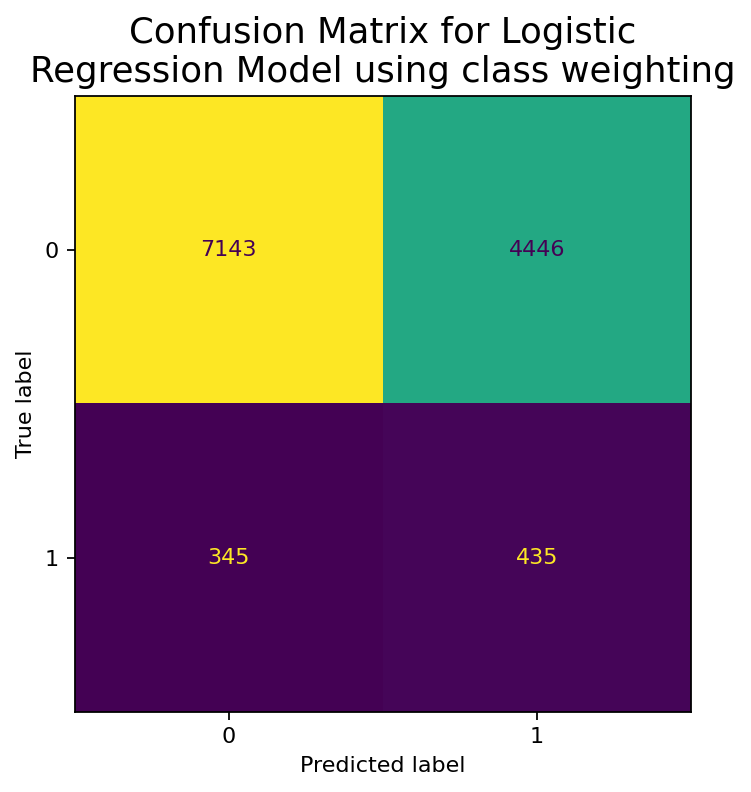

In [25]:
fig, ax = plt.subplots(figsize=(5, 5), dpi=160)

cm = confusion_matrix(y_test, lr_model_5.predict(x_test), labels=[0, 1])
ConfusionMatrixDisplay(cm).plot(colorbar=False, ax=ax)
plt.title("Confusion Matrix for Logistic\nRegression Model using class weighting", fontsize=16)
plt.show()

This cell reveals that logistic regression as a classifier predicts the class which belongs to the higher probability

In [26]:
(lr_model_5.predict_proba(x_test).argmax(axis=1) == lr_model_5.predict(x_test)).all()

np.True_

In [27]:
TP = 435
FN = 345
FP = 4446

TP / (TP + FN), TP / (TP + FP)  # Recall and Precision respectively

(0.5576923076923077, 0.08912108174554395)

### Describe why we want to maximize recall in our case (Sports betting context)
* Recall is more appropriate in our case because we care more about identifying as many of the sacks as sacks as possible knowing that in order to do so we will likely have more false positives which is when we predict non sack plays to result in a sack.
* As I understand it, in sports betting, it behooves the sports book to claim that an outcome is more likely than it really is which reduces the overall return for that bet giving the sports book the margins they are looking for.
Honestly, I am still learning more about the industry, but my main takeaway is that we would rather catch as many sacks as we can and we're okay if we end up predicting something will be a sack and it ending up not being one.
Hence, we want to maximize recall, which is given by
$$\text{recall} = \frac {TP} {TP + FN}$$

In [28]:
x_train, y_train, x_test, y_test = get_training_test_sets(prepared_scaled_df)

gauss_naive_bayes = GaussianNB()
sample_weight = compute_sample_weight(
    class_weight={
        0: y_train.mean(),
        1: 1 - y_train.mean()
    },
    y=y_train,
)
gauss_naive_bayes.fit(x_train, y_train, sample_weight=sample_weight)

# precision_score(y_test, gauss_naive_bayes.predict(x_test), labels=[0, 1], zero_division=0), recall_score(y_test, gauss_naive_bayes.predict(x_test), labels=[0, 1], zero_division=0)
model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="Naive Bayes",
    model=gauss_naive_bayes,
    x_test=x_test,
    y_test=y_test,
    desc=f"Naive Bayes model trained on {', '.join(lr_model.feature_names_in_)} features with a standard scaler applied.",
    standard_scaled=True
)

In [29]:
x_train, y_train, x_test, y_test = get_training_test_sets(prepared_extended_df)

gauss_naive_bayes = GaussianNB()
sample_weight = compute_sample_weight(
    class_weight={
        0: y_train.mean(),
        1: 1 - y_train.mean()
    },
    y=y_train,
)
gauss_naive_bayes.fit(x_train, y_train, sample_weight=sample_weight)

# precision_score(y_test, gauss_naive_bayes.predict(x_test), labels=[0, 1], zero_division=0), recall_score(y_test, gauss_naive_bayes.predict(x_test), labels=[0, 1], zero_division=0)
model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="Extended Naive Bayes",
    model=gauss_naive_bayes,
    x_test=x_test,
    y_test=y_test,
    desc=f"Naive Bayes model trained on {', '.join(lr_model.feature_names_in_)} features with no standard scaling.",
    standard_scaled=True
)
model_performance_df

,model_id,model,desc,accuracy,precision,recall,f1_score,standard_scaled,class_weighting
0,0,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,False,False
1,1,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,True,False
2,2,Base Logistic Regression,Logistic Regression model trained on yardline_...,0.686717,0.092227,0.448718,0.153005,False,True
3,3,Extended Logistic Regression,Logistic Regression model trained on yardline_...,0.936939,0.000000,0.000000,0.000000,False,False
4,4,Extended Logistic Regression,Logistic Regression model trained on yardline_...,0.612661,0.089121,0.557692,0.153683,False,True
5,5,Naive Bayes,"Naive Bayes model trained on yardline_100, qua...",0.688981,0.093560,0.452564,0.155063,True,True
6,6,Extended Naive Bayes,"Naive Bayes model trained on yardline_100, qua...",0.552429,0.076114,0.547436,0.133646,True,True


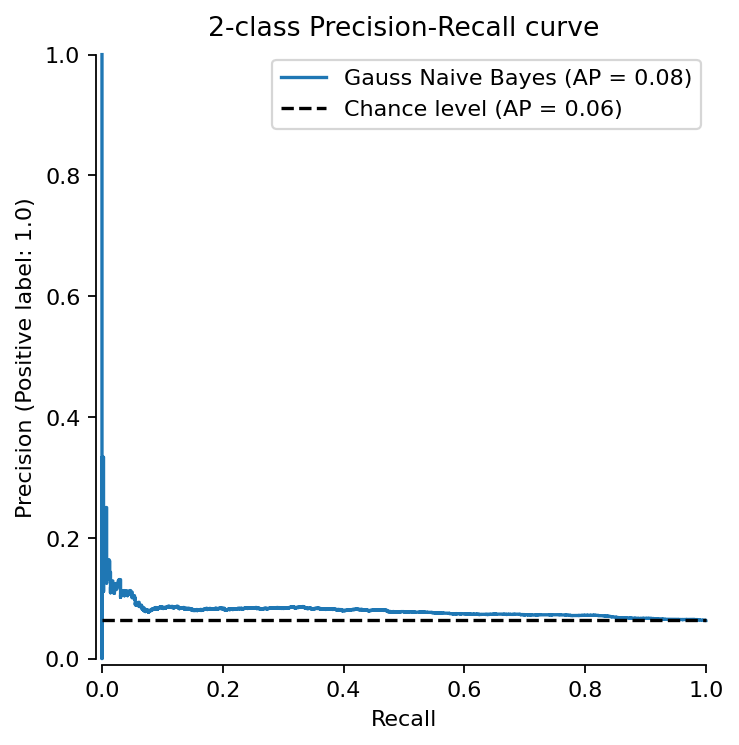

In [30]:
fig, ax = plt.subplots(figsize=(5, 5), dpi=160)

display = PrecisionRecallDisplay.from_estimator(
    gauss_naive_bayes, x_test, y_test, name="Gauss Naive Bayes", plot_chance_level=True, despine=True, ax=ax
)
display.ax_.set_xlabel("Recall")
_ = display.ax_.set_title("2-class Precision-Recall curve")
plt.legend(loc="upper right")
plt.show()

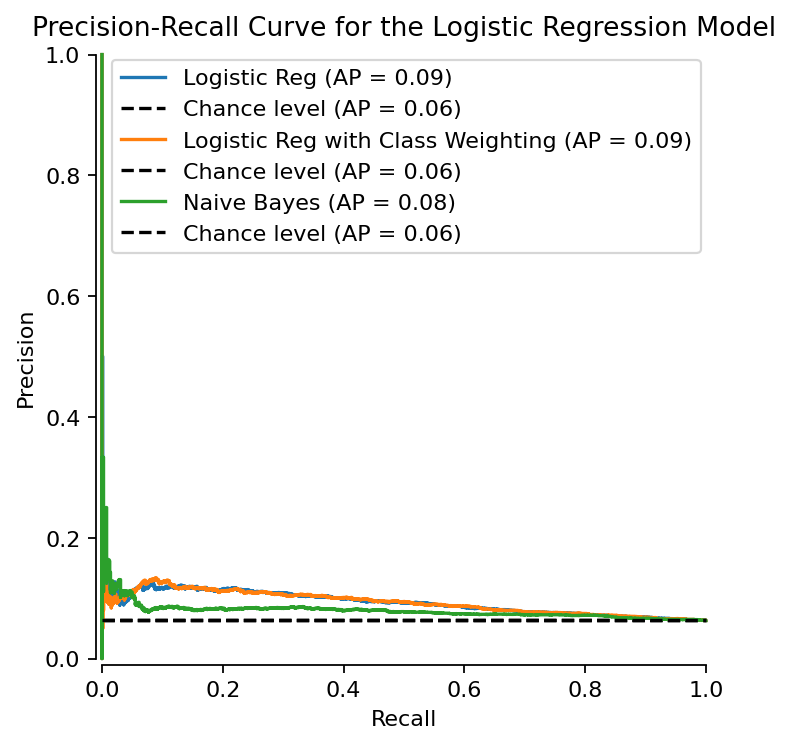

In [31]:
# precision, recall, thresholds = precision_recall_curve(y_test, lr_model.predict_proba(x_test)[:, 1], pos_label=1)
fig, ax = plt.subplots(figsize=(5, 5), dpi=160)

names = ["Logistic Reg", "Logistic Reg with Class Weighting", "Naive Bayes"]
for model, name in zip([lr_model_4, lr_model_5, gauss_naive_bayes], names):
    display = PrecisionRecallDisplay.from_estimator(
        model, x_test, y_test, name=name, plot_chance_level=True, despine=True, ax=ax
    )
    display.ax_.set_xlabel("Recall")
    _ = display.ax_.set_title("2-class Precision-Recall curve")
    plt.legend(loc="upper right")

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve for the Logistic Regression Model")
plt.legend()
plt.show()

### Advanced Input Features
I want to incorporate the information about individual players who are likely on the field at the time. Information about how many times the quarterback had been sacked the previous year and how many total sacks the team had a previous year. We could also be more spectific about the player level sack totals and gauge the likelihood of a sack based in part on that information.

In [32]:
def load_def_advstats():
    """
    Load passer advanced statistics from the CSV file.

    :return: DataFrame containing passer advanced statistics.
    """
    advstats_df = pd.DataFrame()

    for year in range(2021, 2024):
        cur_year_advs_df = pd.read_csv(
            f"data/advstats_week_def_{year}.csv",
            header=0,
        )
        advstats_df = pd.concat([advstats_df, cur_year_advs_df], ignore_index=True)
    
    return advstats_df


def load_passer_advstats():
    """
    Load passer advanced statistics from the CSV file.

    :return: DataFrame containing passer advanced statistics.
    """
    advstats_df = pd.DataFrame()

    for year in range(2021, 2024):
        cur_year_advs_df = pd.read_csv(
            f"data/advstats_week_pass_{year}.csv",
            header=0,
        )
        advstats_df = pd.concat([advstats_df, cur_year_advs_df], ignore_index=True)
    
    return advstats_df


def estimate_unknown_season_sack_related_data(
    df: pd.DataFrame,
    fields: list[str],
    team_type: str,
    prev_season: int = 2020
) -> pd.DataFrame:
    """
    Estimate the previous season's sack related data for a year whose data is not available.

    :param df: DataFrame containing sack related data.
    :param fields: List of fields to estimate.
    :param team_type: Type of team to filter by (e.g., "posteam" or "defteam").
    :param prev_season: The season to use for estimation (default is 2020).

    :return: DataFrame with estimated previous season's sack related data.
    """
    temp_df = df.copy()
    temp_df.drop(columns=["prev_season"], inplace=True)
    temp_df = temp_df.groupby(team_type, as_index=False).mean()
    for field in fields:
        temp_df[field] = temp_df[field].astype(int)  # Cast to integers because they are counts
    temp_df["prev_season"] = prev_season
    return temp_df


def process_advstats(
    advstats_df: pd.DataFrame,
    team_type: str,
    fields: list[str],
) -> pd.DataFrame:
    """
    Process advanced statistics DataFrame by selecting relevant fields.

    :param advstats_df: DataFrame containing passer or def advanced statistics.
    :param team_type: Type of team to filter by (e.g., "posteam" or "defteam").
    :param fields: List of fields to select from the DataFrame.

    :return: Processed DataFrame with selected fields.
    """
    passer_sack_agg_fields_with_prefix = {
        f"prev_szn{('_' + team_type) if team_type == 'posteam' else ''}_{field}": (field, "sum")
        for field in fields
    }

    advstats_df = advstats_df.astype({"season": int})
    prev_season_advstats_df = advstats_df.groupby(
        by=["team", "season"],
        as_index=False
    ).agg(**passer_sack_agg_fields_with_prefix)
    prev_season_advstats_df.rename(
        columns={"team": team_type, "season": "prev_season"},
        inplace=True,
    )
    estimated_2020_stats = estimate_unknown_season_sack_related_data(
        prev_season_advstats_df,
        prev_season_advstats_df.columns.difference([team_type, "prev_season"]),
        team_type=team_type,
        prev_season=2020
    )
    prev_season_advstats_df = pd.concat(
        [prev_season_advstats_df, estimated_2020_stats],
        ignore_index=True
    )
    return prev_season_advstats_df


def enrich_passing_plays_data_with_prev_szn_stats(
    passing_plays_df: pd.DataFrame,
    fields: list[str],
) -> pd.DataFrame:
    """
    Prepare the passing plays DataFrame for training by merging it with advanced statistics
    from the previous season. This includes relevant sack-related statistics for both
    the offensive and defensive teams.

    :param passing_plays_df: DataFrame containing passing plays data.
    :param fields: List of fields to use as predictors.
    
    :return: DataFrame ready for training with advanced statistics merged.
    """
    advstats_passer_df = load_passer_advstats()
    advstats_def_df = load_def_advstats()

    passer_sack_relevant_fields = ["times_sacked", "times_blitzed", "times_hurried", "times_hit", "times_pressured"]
    posteam_advstats_df = process_advstats(         
        advstats_df=advstats_passer_df,
        team_type="posteam",
        fields=passer_sack_relevant_fields,
    )
    def_sack_relevant_fields = ["def_times_blitzed", "def_times_hurried", "def_times_hitqb", "def_sacks", "def_pressures"]
    defteam_advstats_df = process_advstats(
        advstats_df=advstats_def_df,
        team_type="defteam",
        fields=def_sack_relevant_fields,
    )

    # Augment the passing plays DataFrame with minimal metadata
    augmented_fields = fields + ["game_id"]
    passing_plays_with_minimal_metadata = passing_plays_df[augmented_fields].copy()
    passing_plays_with_minimal_metadata["prev_season"] = passing_plays_with_minimal_metadata.apply(
        lambda row: int(row["game_id"][:4]) - 1,
        axis=1
    )
    passing_plays_with_minimal_metadata.drop(columns=["game_id"], inplace=True)

    # Merge the passing plays DataFrame with the advanced statistics DataFrames
    passing_plays_with_minimal_metadata = passing_plays_with_minimal_metadata.merge(
        posteam_advstats_df,
        how="left",
        on=["posteam", "prev_season"],
    )
    passing_plays_with_minimal_metadata = passing_plays_with_minimal_metadata.merge(
        defteam_advstats_df,
        how="left",
        on=["defteam", "prev_season"],
    )
    passing_plays_with_minimal_metadata.drop(columns=["prev_season"], inplace=True)
    return passing_plays_with_minimal_metadata


In [33]:
passing_training_data_df = enrich_passing_plays_data_with_prev_szn_stats(
    passing_plays_df=passing_plays_df,
    fields=extended_predictive_fields,
)
passing_training_data_df.drop(columns=["posteam", "defteam"], inplace=True)

In [34]:
prepared_enriched_df = prepare_data_for_training(
    passing_training_data_df,
    passing_training_data_df.columns,
    fields_to_encode=["down", "qtr"], # , "defteam", "posteam"],
    do_standard_scale=True,
    label_field="sack",
)
x_train, y_train, x_test, y_test = get_training_test_sets(prepared_enriched_df)
lr_model_6 = LogisticRegression(
    penalty="l2",
    solver="lbfgs",
    max_iter=1000,
    random_state=42,
    class_weight={1.0: 1 - y_train.mean(), 0.0: y_train.mean()},
)
lr_model_6.fit(x_train, y_train)

model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="Enriched Logistic Regression with prev szn stats",
    model=lr_model_6,
    x_test=x_test,
    y_test=y_test,
    desc=f"Logistic Regression model trained on {', '.join(lr_model.feature_names_in_)} features with a standard scaler applied.",
    standard_scaled=True
)

In [35]:
rf_model = RandomForestClassifier(
    n_estimators=200,
    max_depth=5,
    random_state=42,
    class_weight={1.0: 1 - y_train.mean(), 0.0: y_train.mean()},
)
rf_model.fit(x_train, y_train)
model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="Random Forest Classifier with prev szn stats",
    model=rf_model,
    x_test=x_test,
    y_test=y_test,
    desc=f"Random Forest Classifier model trained on {', '.join(rf_model.feature_names_in_)} features with a standard scaler applied.",
    standard_scaled=True
)

In [36]:
xgb_model = XGBClassifier(
    n_estimators=200,
    max_depth=5,
    random_state=42,
    eval_metric="logloss",
    scale_pos_weight=((len(y_train) - y_train.sum()) / y_train.sum())
)
xgb_model.fit(x_train, y_train)
model_performance_df = record_model_results(
    model_performance_df=model_performance_df,
    model_name="XGBoost Classifier with prev szn stats",
    model=xgb_model,
    x_test=x_test,
    y_test=y_test,
    desc=f"XGBoost Classifier model trained on {', '.join(xgb_model.feature_names_in_)} features with a standard scaler applied.",
    standard_scaled=True
)

In [37]:
top_5_models = model_performance_df.loc[model_performance_df.sort_values(by=["recall"], ascending=False).index[:5]]
top_5_models

,model_id,model,desc,accuracy,precision,recall,f1_score,standard_scaled,class_weighting
4,4,Extended Logistic Regression,Logistic Regression model trained on yardline_...,0.612661,0.089121,0.557692,0.153683,False,True
6,6,Extended Naive Bayes,"Naive Bayes model trained on yardline_100, qua...",0.552429,0.076114,0.547436,0.133646,True,True
7,7,Enriched Logistic Regression with prev szn stats,Logistic Regression model trained on yardline_...,0.646940,0.090057,0.505128,0.152861,True,True
8,8,Random Forest Classifier with prev szn stats,Random Forest Classifier model trained on yard...,0.699733,0.097862,0.457692,0.161247,True,True
5,5,Naive Bayes,"Naive Bayes model trained on yardline_100, qua...",0.688981,0.093560,0.452564,0.155063,True,True


In [38]:
accuracy_chart = alt.Chart(top_5_models).mark_bar().encode(
    x=alt.X("model:N", title="Model", axis=alt.Axis(labels=False, ticks=False)),
    y=alt.Y("accuracy:Q", title="Accuracy", scale=alt.Scale(domain=[0, 1])),
    color=alt.Color("model:N", title="Model Description"),
).properties(
    width=150,
)

f1_chart = alt.Chart(top_5_models).mark_bar().encode(
    x=alt.X("model:N", title="Model", axis=alt.Axis(labels=False, ticks=False)),
    y=alt.Y("f1_score:Q", title="F1 Score", scale=alt.Scale(domain=[0, 1])),
    color=alt.Color("model:N", title="Model Description"),
).properties(
    width=150,
)

precision_chart = alt.Chart(top_5_models).mark_bar().encode(
    x=alt.X("model:N", title="Model", axis=alt.Axis(labels=False, ticks=False)),
    y=alt.Y("precision:Q", title="Precision", scale=alt.Scale(domain=[0, 1])),
    color=alt.Color("model:N", title="Model Description"),
).properties(
    width=150,
)

recall_chart = alt.Chart(top_5_models).mark_bar().encode(
    x=alt.X("model:N", title="Model", axis=alt.Axis(labels=False, ticks=False)),
    y=alt.Y("recall:Q", title="Recall", scale=alt.Scale(domain=[0, 1])),
    color=alt.Color("model:N", title="Model Description"),
).properties(
    width=150,
)

(accuracy_chart | precision_chart | recall_chart | f1_chart).properties(
    title=alt.Title(
        "The best model by our standard, recall, is not very remarkable by other metrics",
        fontSize=25,
        subtitle=["The best model was trained on the first set of extended features which included", "posteam and defteam in addition to the basic set of circumstantial features."],
        subtitleFontSize=18
    )
)


alt.HConcatChart(...)

## Conclusions and Future Work
[![Return to Top](https://img.shields.io/badge/⬆-Top-blue)](#Outline)

Though weighting things by class helped get the recall score up the prediction probabilities became unrealistic, claiming at times a sack is nearly a 50/50 chance given a certain scenario. This appears to me to be a gross overestimate as a result of our trying to counteract the inbalanced classes.

In conclusion, I would advocate for a simpler model similar to those propsed in the initial brainstorming session which is basically an empirical estimate of the probability of a sack occuring given a set of input features we condition on.
This will result in what I believe to be a more accurate likelihood of the outcome.
However, it is really hard to justify how good or bad of an estimate of the probability it is because of the nature of the problem without having a guarunteed ground truth to aim for.
Additionally, I would advocate for such an empirical estimate because it is very transparent and easy to explain to stakeholders how we are justifying the probabilty we have determined for the outcome.

Other possible future work could be to
* predict based on flipping a coin given that the coin comes up heads (results in a sack) with probability as predicted by a model we trained like above. See an example of this below.
* Additionally we did not incorporate yet player level information only game circumstantial and team level information.


recall: 0.5230769230769231
precision: 0.06912910877668586


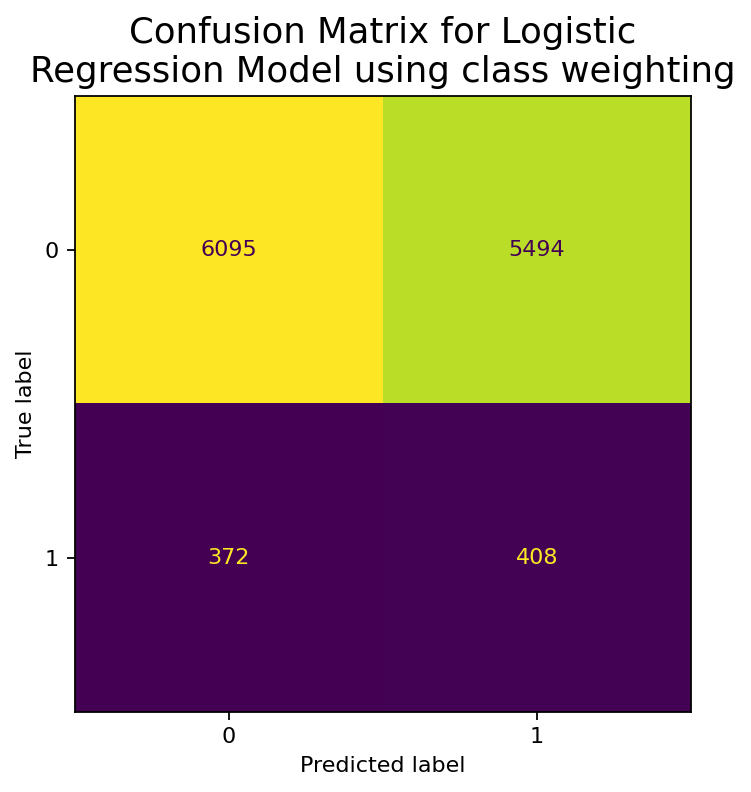

In [39]:
probas = lr_model_6.predict_proba(x_test)[:,1]
random_nums = np.random.rand(len(probas))
predictions = (probas > random_nums).astype(int)

# predictions.sum()
# probas
# random_nums
# predictions

print(f"recall: {recall_score(y_test, predictions, zero_division=0)}")
print(f"precision: {precision_score(y_test, predictions, zero_division=0)}")

fig, ax = plt.subplots(figsize=(5, 5), dpi=160)

cm = confusion_matrix(y_test, predictions, labels=[0, 1])
ConfusionMatrixDisplay(cm).plot(colorbar=False, ax=ax)
plt.title("Confusion Matrix for Logistic\nRegression Model using class weighting", fontsize=16)
plt.show()